# EXHAUSTIVE AI-POWERED EXPLAINABILITY IN CREDIT SCORE MODELING
## A detailed study leveraging AI-Driven Explainability to enhance transparency, fairness, and trust in Credit score modelling for informed decision-making

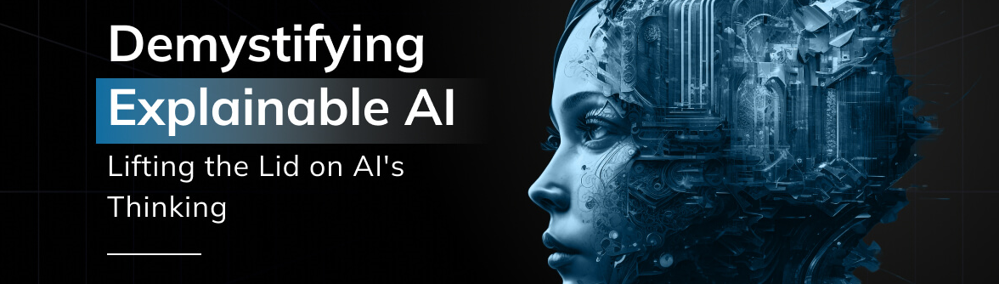

In [4]:
# To ignore the warnings that may appear

import warnings
warnings.filterwarnings("ignore")

In [5]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler

import sys
sys.path.append('../')

In [6]:
#import os

#for dirname, _, filenames in os.walk('.'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

In [7]:
# Loading the dataset using pandas

CUSTOMER_CREDIT_SCORE_SOURCE_PATH = 'customer_credit_score.csv' # kaggle source

df = pd.read_csv(CUSTOMER_CREDIT_SCORE_SOURCE_PATH)

df.columns

Index(['CUSTOMER_ID', 'NET_INCOME', 'NET_SAVINGS', 'DEBT', 'R_SAVINGS_INCOME',
       'R_DEBT_INCOME', 'R_DEBT_SAVINGS', 'T_CLOTHING_12', 'T_CLOTHING_6',
       'R_CLOTHING', 'R_CLOTHING_INCOME', 'R_CLOTHING_SAVINGS',
       'R_CLOTHING_DEBT', 'T_EDUCATION_12', 'T_EDUCATION_6', 'R_EDUCATION',
       'R_EDUCATION_INCOME', 'R_EDUCATION_SAVINGS', 'R_EDUCATION_DEBT',
       'T_ENTERTAINMENT_12', 'T_ENTERTAINMENT_6', 'R_ENTERTAINMENT',
       'R_ENTERTAINMENT_INCOME', 'R_ENTERTAINMENT_SAVINGS',
       'R_ENTERTAINMENT_DEBT', 'T_FINES_12', 'T_FINES_6', 'R_FINES',
       'R_FINES_INCOME', 'R_FINES_SAVINGS', 'R_FINES_DEBT', 'T_GAMBLING_12',
       'T_GAMBLING_6', 'R_GAMBLING', 'R_GAMBLING_INCOME', 'R_GAMBLING_SAVINGS',
       'R_GAMBLING_DEBT', 'T_GROCERIES_12', 'T_GROCERIES_6', 'R_GROCERIES',
       'R_GROCERIES_INCOME', 'R_GROCERIES_SAVINGS', 'R_GROCERIES_DEBT',
       'T_HEALTH_12', 'T_HEALTH_6', 'R_HEALTH', 'R_HEALTH_INCOME',
       'R_HEALTH_SAVINGS', 'R_HEALTH_DEBT', 'T_HOUSING_12', 'T_H

In [8]:
df.head(10)

,CUSTOMER_ID,NET_INCOME,NET_SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,...,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_GAMBLING,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,NET_CREDIT_SCORE,IF_DEFAULT
0,C02COQEVYU,33269,0,532304,0.0000,16.0000,1.2000,1889,945,0.5003,...,0.0000,0.0625,High,1,0,0,0,0,444,1
1,C02OZKC0ZF,77158,91187,315648,1.1818,4.0909,3.4615,5818,111,0.0191,...,0.7692,0.2222,No,1,0,0,1,0,625,0
2,C03FHP2D0A,30917,21642,534864,0.7000,17.3000,24.7142,1157,860,0.7433,...,1.4286,0.0578,High,1,0,0,1,0,469,1
3,C03PVPPHOY,80657,64526,629125,0.8000,7.8000,9.7499,6857,3686,0.5376,...,1.2500,0.1282,High,1,0,0,1,0,559,0
4,C04J69MUX0,149971,1172498,2399531,7.8182,16.0000,2.0465,1978,322,0.1628,...,0.1163,0.0568,High,1,1,1,1,1,473,0
5,C04Q46QKOG,181636,339055,1695274,1.8667,9.3334,5.0000,11446,1910,0.1669,...,0.3571,0.0714,No,1,0,0,1,0,596,0
6,C069MLDS7X,60881,42617,383550,0.7000,6.3000,8.9999,2658,117,0.0440,...,1.4286,0.1587,No,1,0,0,1,0,580,0
7,C07VC05Z4R,220838,186863,2225362,0.8462,10.0769,11.9091,4383,1272,0.2902,...,0.9091,0.0763,No,1,1,0,1,0,596,0
8,C0CLKGEG1L,78615,62892,110061,0.8000,1.4000,1.7500,5912,2346,0.3968,...,1.2500,0.7143,High,1,0,0,1,0,638,0
9,C0DYD1C2G1,174000,1502729,411273,8.6364,2.3636,0.2737,2831,812,0.2868,...,0.1053,0.3846,High,1,0,1,1,1,636,0


In [9]:
df.tail()

,CUSTOMER_ID,NET_INCOME,NET_SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,...,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_GAMBLING,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,NET_CREDIT_SCORE,IF_DEFAULT
995,CZQHJC9HDH,328892,1465066,5501471,4.4546,16.7273,3.7551,16701,10132,0.6067,...,0.2041,0.0543,High,1,1,1,1,1,418,0
996,CZRA4MLB0P,81404,88805,680837,1.0909,8.3637,7.6667,5400,1936,0.3585,...,0.8333,0.1087,No,1,0,0,1,0,589,1
997,CZSOD1KVFX,0,42428,30760,3.2379,8.1889,0.7250,0,0,0.8779,...,0.2500,0.3448,No,1,0,0,1,0,499,0
998,CZWC76UAUT,36011,8002,604181,0.2222,16.7777,75.5037,1993,1271,0.6377,...,5.0002,0.0662,No,1,1,0,1,0,507,0
999,CZZV5B3SAL,44266,309859,44266,6.9999,1.0000,0.1429,1574,1264,0.8030,...,0.1587,1.1111,No,1,0,0,1,0,657,0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 87 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   CUSTOMER_ID              1000 non-null   object 
 1   NET_INCOME               1000 non-null   int64  
 2   NET_SAVINGS              1000 non-null   int64  
 3   DEBT                     1000 non-null   int64  
 4   R_SAVINGS_INCOME         1000 non-null   float64
 5   R_DEBT_INCOME            1000 non-null   float64
 6   R_DEBT_SAVINGS           1000 non-null   float64
 7   T_CLOTHING_12            1000 non-null   int64  
 8   T_CLOTHING_6             1000 non-null   int64  
 9   R_CLOTHING               1000 non-null   float64
 10  R_CLOTHING_INCOME        1000 non-null   float64
 11  R_CLOTHING_SAVINGS       1000 non-null   float64
 12  R_CLOTHING_DEBT          1000 non-null   float64
 13  T_EDUCATION_12           1000 non-null   int64  
 14  T_EDUCATION_6            

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
NET_INCOME,1000.0,121610.019000,113716.699591,0.0,30450.2500,85090.00000,1.812175e+05,6.620940e+05
NET_SAVINGS,1000.0,413189.597000,442916.037068,0.0,59719.7500,273850.50000,6.222600e+05,2.911863e+06
DEBT,1000.0,790718.045000,981790.391354,0.0,53966.7500,395095.50000,1.193230e+06,5.968620e+06
R_SAVINGS_INCOME,1000.0,4.063477,3.968097,0.0,1.0000,2.54545,6.307100e+00,1.611120e+01
R_DEBT_INCOME,1000.0,6.068449,5.847878,0.0,1.4545,4.91155,8.587475e+00,3.700060e+01
...,...,...,...,...,...,...,...,...
CAT_MORTGAGE,1000.0,0.173000,0.378437,0.0,0.0000,0.00000,0.000000e+00,1.000000e+00
CAT_SAVINGS_ACCOUNT,1000.0,0.993000,0.083414,0.0,1.0000,1.00000,1.000000e+00,1.000000e+00
CAT_DEPENDENTS,1000.0,0.150000,0.357250,0.0,0.0000,0.00000,0.000000e+00,1.000000e+00
NET_CREDIT_SCORE,1000.0,586.712000,63.413882,300.0,554.7500,596.00000,6.300000e+02,8.000000e+02


In [12]:
df.describe(include="object").T

,count,unique,top,freq
CUSTOMER_ID,1000,1000,C02COQEVYU,1
CAT_GAMBLING,1000,3,No,620


In [13]:
df.describe(include="number").T

,count,mean,std,min,25%,50%,75%,max
NET_INCOME,1000.0,121610.019000,113716.699591,0.0,30450.2500,85090.00000,1.812175e+05,6.620940e+05
NET_SAVINGS,1000.0,413189.597000,442916.037068,0.0,59719.7500,273850.50000,6.222600e+05,2.911863e+06
DEBT,1000.0,790718.045000,981790.391354,0.0,53966.7500,395095.50000,1.193230e+06,5.968620e+06
R_SAVINGS_INCOME,1000.0,4.063477,3.968097,0.0,1.0000,2.54545,6.307100e+00,1.611120e+01
R_DEBT_INCOME,1000.0,6.068449,5.847878,0.0,1.4545,4.91155,8.587475e+00,3.700060e+01
...,...,...,...,...,...,...,...,...
CAT_MORTGAGE,1000.0,0.173000,0.378437,0.0,0.0000,0.00000,0.000000e+00,1.000000e+00
CAT_SAVINGS_ACCOUNT,1000.0,0.993000,0.083414,0.0,1.0000,1.00000,1.000000e+00,1.000000e+00
CAT_DEPENDENTS,1000.0,0.150000,0.357250,0.0,0.0000,0.00000,0.000000e+00,1.000000e+00
NET_CREDIT_SCORE,1000.0,586.712000,63.413882,300.0,554.7500,596.00000,6.300000e+02,8.000000e+02


In [14]:
df.shape

(1000, 87)

In [15]:
df.select_dtypes(include='object').nunique()

CUSTOMER_ID     1000
CAT_GAMBLING       3
dtype: int64

In [16]:
# Plotly Express Box Plot
columns_num = ["NET_CREDIT_SCORE"]
fig = px.box(df.loc[:, columns_num], width=1500, height=500,title='Plotly Express Box Plot')
fig.show()

In [17]:
corr = df.corr(method='pearson', numeric_only = True) # other method = Spearman , Kendall 
corr.style.background_gradient(cmap='coolwarm')

Text(0.5, 1.0, 'Correlation Matrix !!')

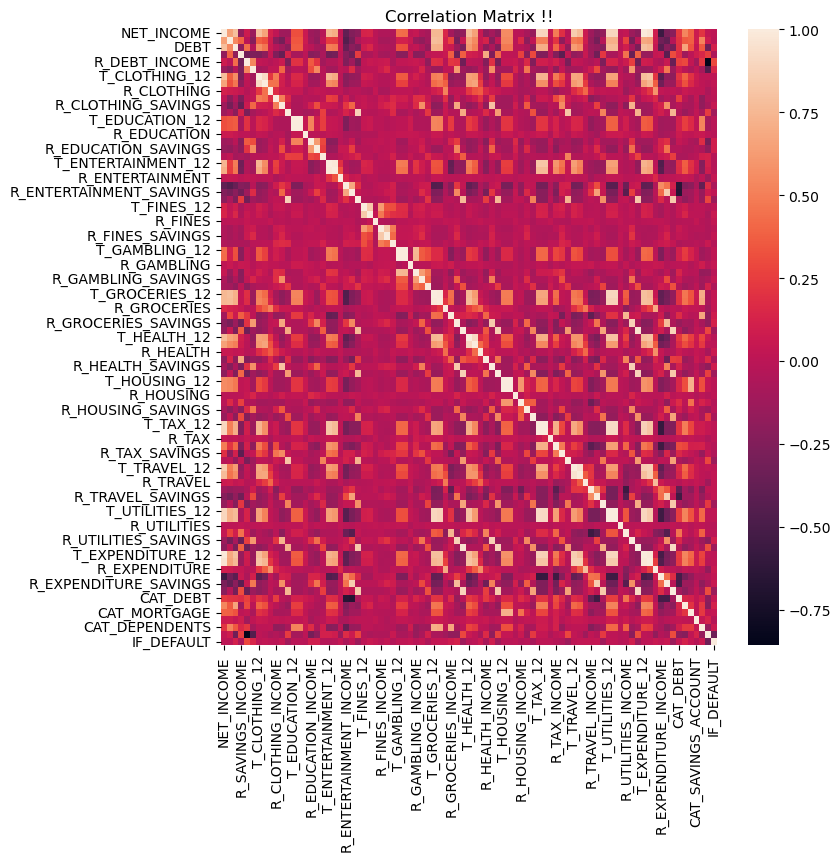

In [18]:
plt.figure(figsize=(8,8))
sns.heatmap(corr)
plt.title("Correlation Matrix !!")

,NET_INCOME,NET_SAVINGS,DEBT,R_SAVINGS_INCOME,R_DEBT_INCOME,R_DEBT_SAVINGS,T_CLOTHING_12,T_CLOTHING_6,R_CLOTHING,R_CLOTHING_INCOME,...,R_EXPENDITURE_INCOME,R_EXPENDITURE_SAVINGS,R_EXPENDITURE_DEBT,CAT_DEBT,CAT_CREDIT_CARD,CAT_MORTGAGE,CAT_SAVINGS_ACCOUNT,CAT_DEPENDENTS,NET_CREDIT_SCORE,IF_DEFAULT
NET_INCOME,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NET_SAVINGS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DEBT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
R_SAVINGS_INCOME,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
R_DEBT_INCOME,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CAT_MORTGAGE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CAT_SAVINGS_ACCOUNT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CAT_DEPENDENTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NET_CREDIT_SCORE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

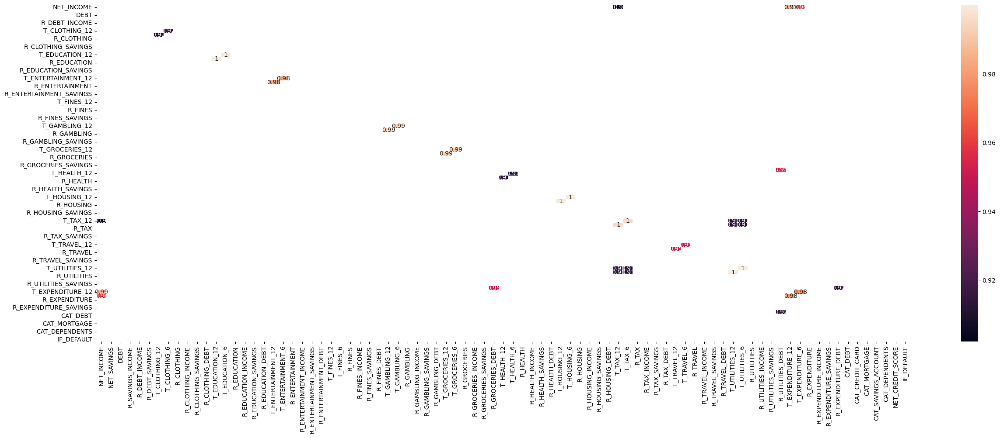

In [19]:
filteredDf = corr[((corr > 0.9) | (corr < -0.9)) & (corr !=1.000)]
display(filteredDf)

plt.figure(figsize=(30,10))
sns.heatmap(filteredDf, annot=True)

In [20]:
# Features Summary

!pip install summarytools

from summarytools import dfSummary

dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,CUSTOMER_ID[object],1. C02COQEVYU2. COTTPMD2Q83. COHOIPUQJY4. COI3MBCR095. COJ8Y0F6NT6. COKORHC6JP7. COLA3DY6P58. COOEL3G0BF9. COP6FKAJW110. COPF3LLVUR11. other,1 (0.1%)1 (0.1%)1 (0.1%)1 (0.1%)1 (0.1%)1 (0.1%)1 (0.1%)1 (0.1%)1 (0.1%)1 (0.1%)990 (99.0%),"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAD+CAYAAAAtWHdlAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjkuMiwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8hTgPZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAADXElEQVR4nO3cwWkbYRRG0TdGOPZGQhhcQtKDi0ixKUJFpAdjPIvY8WaySBYpINwB5ZwK/sWFh2A+Ldu2DRRu9n4A/w+xkREbGbGRERsZsZERGxmxkREbGbGRuVmW5cuyLHd7P4TrdzMzn2fm094P4fo5o2TERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRG5mZmvs/Mz70fwvVb/IsRFWeUjNjIWFeRsa4i44ySERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZExeCFj8ELGGSUjNjIGL2QMXsg4o2TERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZAxeyBi8kHFGyYiNjNjIWFeRsa4i44ySERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZGxriJjXUXGGSUjNjIGL2QMXsg4o2TERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZAxeyBi8kHFGyYiNjMELGYMXMs4oGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZGxriJjXUXGGSUjNjLWVWSsq8g4o2TERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZAxeyBi8kHFGyYiNjMELGYMXMs4oGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZgxcyBi9knFEyYiMjNjLWVWSsq8g4o2TERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZKyryFhXkXFGyYiNjMELGYMXMs4oGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZgxcyBi9knFEyy8zcz8zt3g/hqn1s2/Z2eHh4+Ho8Hs97v4brta7ry7Is3w7H4/H89PT0djqd3vd+FNfn9fX17nK5nJ+fn28PMzOn0+n98fHxx94P42rdz/iBQEhsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERuYw8/szkL0fwnX6u63Duq4vl8vlPH8+A4F/bV3Xl5n58Fk4hY9t296sq8j4gUBGbGTERkZsZMRGRmxkxEZGbGTERuYXwgdpOf758ysAAAAASUVORK5CYII="">",0(0.0%)
2,NET_INCOME[int64],Mean (sd) : 121610.0 (113716.7)min < med < max:0.0 < 85090.0 < 662094.0IQR (CV) : 150767.2 (1.1),951 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjkuMiwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8hTgPZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACTUlEQVR4nO3dz6raQBiH4W/qORKPkCAW3XkJXbj0Inqx3XYpeDFCOEZMY5WQbmoptOeoM6ad3/A+azO6eMmfMZO4rusMiN2H//0DgFs8XfuAc25kZkPP8U9d1zWe2wK/vBuqc240nU4/53k+8Rl8v9+/Oue+ECtCXdujDvM8n6xWq6YoiuM9A1dVlW02m0lZlkMzI1QEuXroNzMriuI4m82+eYw/8tgG+AMXU5BAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBw04N8fbVt+2xmuXPOdwjeAQAz6zHUuq6fz+fzp8ViMRgMBnc9Vv2CdwDgordQT6fTU5ZlL8vl8jifz1/v3Z53AOB3vR76zczG47Hv8//NeAcAfuJiChIIFRJ6P/SHCJw1YMYgIdGGGjprwIxBWqINNWTWgBmD9EQb6kXArAEzBgnhYgoSCBUSCBUSCBUSCBUSCBUSCBUSCBUSop/w98XqgrQkGSqrC9KTZKisLkhPkqFehKwuaNs2N24xjEbSofriFsP4EOpfcIthfAj1HdxiGA9C7QFLaB6PUB+M89t+EOqDcX7bD0Ltie/5beC0mFmipw6EGhH+UXsboUbkEf+ordfrWVmWH51ze5+fEGvgN4VaVVV278CHwyEzM6vrOttuty//cnvV775s66tpmqA98m63OzjnvpqZ19480Peu69783h9Nllts961nRwAAAABJRU5ErkJggg=="">",0(0.0%)
3,NET_SAVINGS[int64],Mean (sd) : 413189.6 (442916.0)min < med < max:0.0 < 273850.5 < 2911863.0IQR (CV) : 562540.2 (0.9),992 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjkuMiwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8hTgPZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACV0lEQVR4nO3dMW/aQByG8f+ZgEygtgAJNpbuHRjZu/bDdu3Ot+iOkFAwwg0Fue4SV5WaBnwWwe/p+c25c4ZH+Hw66VxZlga0XXTvfwC4xsOlP3DO9c2s5zn/qSzLZ8+xwB9vhuqc608mky9Jkox8Jt/v90/Oua/EiqYu/aL2kiQZLZfL5zRNj3UmzrIsXq1Wo+122zMzQkUjF1/9ZmZpmh6n0+kPj/n7HmOAf/AxBQmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECgmECglX3YriqyiKrpklzjnfKbhQDWZ2w1DzPO+ez+dP8/m80+l0at1RVeFCNVRuFurpdHqI4/hxsVgcZ7PZU93xXKiGv9301W9mNhgMfC9TM+NCNbzgYwoSCBUSCBUSbr5GbaLh9hZbWwFpbahNt7fY2gpLa0Ntsr3F1lZ4WhtqpcH2FltbAeFjChIIFRIIFRIIFRIIFRJa/9Xvi7OwYQkyVM7ChifIUDkLG54gQ61wFjYcfExBAqFCQtCv/iY4YtguhPoKjhi2D6G+giOG7UOob/DdNSiKIjH/ZUNkZr98Br7wXnY45/pm1rvHsy+5KtQsy+K6Ex8Oh9jMLM/zeLPZPL7n+Hs+e71ef/BdNhRF0c3z/ONwOPweRdG5ztjKbrc7OOe+mVndJUs8H

In [21]:
df.isna().sum()

CUSTOMER_ID            0
NET_INCOME             0
NET_SAVINGS            0
DEBT                   0
R_SAVINGS_INCOME       0
                      ..
CAT_MORTGAGE           0
CAT_SAVINGS_ACCOUNT    0
CAT_DEPENDENTS         0
NET_CREDIT_SCORE       0
IF_DEFAULT             0
Length: 87, dtype: int64

With the help of the statsmodels library, we will build an Ordinary Least Squares (OLS) regression model. This model helps us analyze and interpret the relationship between the features and the target variable.

In [23]:
df['R_EXPENDITURE_SQR'] = df['R_EXPENDITURE']**2  # add squared term

In [24]:
# Select features
X = df[['NET_INCOME', 'NET_SAVINGS', 'R_EXPENDITURE', 'R_EXPENDITURE_SQR', 'R_EXPENDITURE_DEBT', 'R_ENTERTAINMENT', 'CAT_GAMBLING', 'DEBT', 'R_DEBT_INCOME']].copy()

# Applying One-hot encoding
X['GAMBLING_LOW'] = X['CAT_GAMBLING'].apply(lambda x: 1 if x == 'Low' else 0)
X['GAMBLING_HIGH']  = X['CAT_GAMBLING'].apply(lambda x: 1 if x == 'High' else 0)

X.drop(columns=['CAT_GAMBLING'], inplace=True)

# Target label ie NET_CREDIT_SCORE
y = df['NET_CREDIT_SCORE']

X.head()

,NET_INCOME,NET_SAVINGS,R_EXPENDITURE,R_EXPENDITURE_SQR,R_EXPENDITURE_DEBT,R_ENTERTAINMENT,DEBT,R_DEBT_INCOME,GAMBLING_LOW,GAMBLING_HIGH
0,33269,0,0.5797,0.336052,0.0625,0.5065,532304,16.0000,0,1
1,77158,91187,0.3580,0.128164,0.2222,0.5042,315648,4.0909,0,0
2,30917,21642,0.5698,0.324672,0.0578,0.6178,534864,17.3000,0,1
3,80657,64526,0.4985,0.248502,0.1282,0.5094,629125,7.8000,0,1
4,149971,1172498,0.4604,0.211968,0.0568,0.5150,2399531,16.0000,0,1


# eXplainable AI (XAI) Methods

## [1] Interpreting the Linear Regression Model using Statsmodels library

In [27]:
import statsmodels.api as statsmodels

In [130]:
# Add a constant to the independent variables (intercept)
X = statsmodels.add_constant(X)

# Fitting a linear regression model using the Ordinary Least Squares (OLS) method
model_ols = statsmodels.OLS(y, X).fit()

# Output the summary of the model
print(model_ols.summary())

                            OLS Regression Results                            
Dep. Variable:       NET_CREDIT_SCORE   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.828
Method:                 Least Squares   F-statistic:                     481.2
Date:                Tue, 28 Jan 2025   Prob (F-statistic):               0.00
Time:                        20:01:42   Log-Likelihood:                -4683.6
No. Observations:                1000   AIC:                             9389.
Df Residuals:                     989   BIC:                             9443.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                675.3081     21

Explanation:

1. Model Summary
Dependent Variable: NET_CREDIT_SCORE
The target variable being predicted.

R-squared (0.829):
Indicates that 82.9% of the variability in the target variable is explained by the independent variables. Higher values suggest a better fit.

Adj. R-squared (0.828):
Adjusted for the number of predictors in the model. Useful when comparing models with different numbers of predictors.

F-statistic & Prob (F-statistic):
The F-test assesses whether the overall regression model is statistically significant. A near-zero p-value indicates the model is significant.

2. Coefficients Table
This is the most critical section for interpretability in AI explainability.

Columns:
coef:
These are the estimated coefficients for each predictor. They quantify the relationship between the predictor and the target variable.

Positive values (e.g., NET_INCOME, R_EXPENDITURE) increase the NET_CREDIT_SCORE.
Negative values (e.g., DEBT, R_ENTERTAINMENT) decrease it.
std err:
Standard errors of the coefficients, indicating the variability of the estimates.

t:
t-statistic values for testing whether the coefficient is significantly different from zero.

P>|t|:
The p-value for each predictor. Values below 0.05 indicate statistically significant predictors.
For example:

NET_INCOME: Significant (p = 0.000)
GAMBLING_LOW: Not significant (p = 0.129)
[0.025, 0.975]:
Confidence intervals for the coefficients.

Interpreting Specific Predictors:
NET_INCOME (coef = 0.0001):
A unit increase in NET_INCOME is associated with a 0.0001 increase in NET_CREDIT_SCORE. Despite the small coefficient, it is highly significant.

DEBT (coef = -7.1766e-06):
Indicates that debt negatively impacts the credit score, although its magnitude is small.

GAMBLING_HIGH (coef = -24.0264):
Associated with a large negative impact, suggesting it has a strong detrimental effect on credit score.

3. Diagnostic Tests
Durbin-Watson (2.021):
Tests for autocorrelation in residuals. A value near 2 indicates no autocorrelation.

Omnibus, Prob(Omnibus), Skew, Kurtosis:
Evaluate the normality of residuals. Prob(Omnibus) close to 0 suggests non-normality.

Condition Number (103e+21):
A large value indicates potential multicollinearity issues, as noted in the footnote.

4. Explainability Insights
In the context of explainable AI:

Feature Importance:
Coefficients and p-values indicate which predictors significantly affect the outcome.

Model Transparency:
Linear regression inherently provides interpretable relationships, making it ideal for explainability.

Key Observations:
Features like NET_INCOME and DEBT have meaningful effects, while others (e.g., GAMBLING_LOW) may be removed to improve model simplicity.

[0.025 0.975]: The confidence interval for the coefficient, providing a range within which the true value is likely to fall.

In [132]:
print(model_ols.params)

#write out equation for model
print("y = {:.2f} + {:.5f}*NET_INCOME + {:.2f}*NET_SAVINGS + {:.2f}*R_DEBT_INCOME + {:.2f}*R_EXPENDITURE + {:.2f}*R_EXPENDITURE_SQR + {:.2f}*R_ENTERTAINMENT + {:.2f}*DEBT + {:.2f}*R_DEBT_INCOME + {:.2f}*GAMBLING_LOW + {:.2f}*GAMBLING_HIGH".format(model_ols.params[0], model_ols.params[1], model_ols.params[2], model_ols.params[3], model_ols.params[4], model_ols.params[5], model_ols.params[6], model_ols.params[7], model_ols.params[8], model_ols.params[9], model_ols.params[10]))

# write equation using values from first row of dataset
X_0 = X.iloc[0,:]
print("y = {:.2f} + {:.5f}*{} + {:.2f}*{} + {:.2f}*{} + {:.2f}*{} + {:.2f}*{} + {:.2f}*{} + {:.2f}*{} + {:.2f}*{} + {:.2f}*{} + {:.2f}*{}".format(model_ols.params[0], model_ols.params[1], X_0['NET_INCOME'], model_ols.params[2], X_0['NET_SAVINGS'], model_ols.params[3], X_0['R_DEBT_INCOME'],model_ols.params[4], X_0['R_EXPENDITURE'], model_ols.params[5], X_0['R_EXPENDITURE_SQR'], model_ols.params[6], X_0['R_ENTERTAINMENT'], model_ols.params[7], X_0['DEBT'],  model_ols.params[8], X_0['R_DEBT_INCOME'], model_ols.params[9], X_0['GAMBLING_LOW'], model_ols.params[10], X_0['GAMBLING_HIGH']))

# constant
print(674.95 + 0.00009*33269.0  + 253.13*0.5797 + -414.78*0.33605 + -98.45*0.5065 + -7.09*0.0 + -24.82*1.0)

const                 675.308090
NET_INCOME              0.000124
NET_SAVINGS             0.000005
R_EXPENDITURE         236.260133
R_EXPENDITURE_SQR    -399.765999
R_EXPENDITURE_DEBT      0.925642
R_ENTERTAINMENT       -98.973044
DEBT                   -0.000007
R_DEBT_INCOME          -8.727301
GAMBLING_LOW           -7.844807
GAMBLING_HIGH         -23.867458
dtype: float64
y = 675.31 + 0.00012*NET_INCOME + 0.00*NET_SAVINGS + 236.26*R_DEBT_INCOME + -399.77*R_EXPENDITURE + 0.93*R_EXPENDITURE_SQR + -98.97*R_ENTERTAINMENT + -0.00*DEBT + -8.73*R_DEBT_INCOME + -7.84*GAMBLING_LOW + -23.87*GAMBLING_HIGH
y = 675.31 + 0.00012*33269.0 + 0.00*0.0 + 236.26*16.0 + -399.77*0.5797 + 0.93*0.33605208999999997 + -98.97*0.5065 + -0.00*532304.0 + -8.73*16.0 + -7.84*0.0 + -23.87*1.0
610.6119269999999


In [134]:
# Get model predictions
y_pred = model_ols.predict(X)

# Plot predicted vs actual
fig, ax = plt.subplots(figsize=(5, 5))
plt.scatter(y_pred,y)

# Plot y=x line
ax.plot([y.min(), y.max()], [y.min(), y.max()], color='tab:red')

plt.xlabel('Predicted',size=15)
plt.ylabel('Actual', size=15)

Text(0, 0.5, 'Actual')

## [2] Interpreting Feature Hiden relationships using Correlation Matrix 

<Axes: >

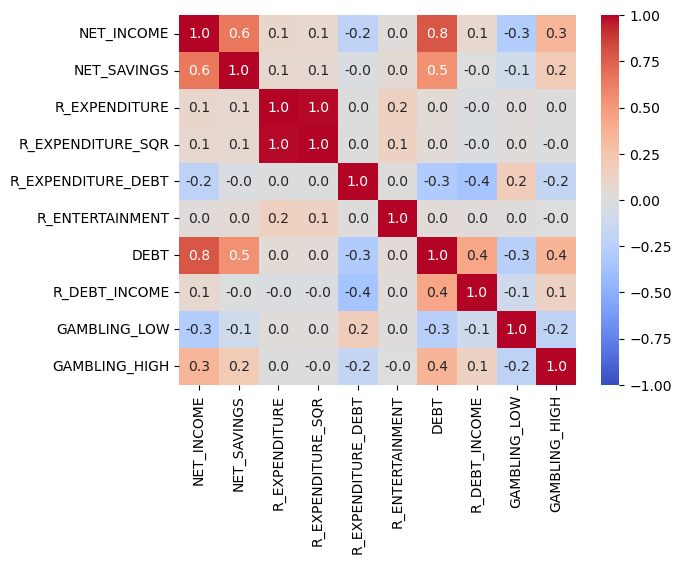

In [33]:
corr_matrix = X.drop('const',axis=1).corr()
sns.heatmap(corr_matrix, cmap="coolwarm", fmt=".1f", vmin=-1, vmax=1,annot=True)

Key Observations:
Highly Correlated Features:
R_EXPENDITURE and R_EXPENDITURE_SQR (+1.0):
Perfect correlation indicates redundancy since R_EXPENDITURE_SQR is likely derived from R_EXPENDITURE (e.g., squared value). One of them could be removed to simplify the model.

NET_INCOME and NET_SAVINGS (+0.6):
A moderate positive correlation suggests that people with higher income tend to save more.

DEBT and NET_INCOME (+0.8):
Indicates individuals with higher income might also have higher debt.

Weak or Negative Correlations:
GAMBLING_LOW and NET_INCOME (-0.3):
Suggests individuals with lower gambling expenditures might have higher incomes.

GAMBLING_HIGH and DEBT (+0.3):
Positive correlation indicates a tendency for individuals with high gambling activity to have more debt.

Potential Multicollinearity Issues:
High correlations like R_EXPENDITURE vs. R_EXPENDITURE_SQR and NET_INCOME vs. DEBT could lead to multicollinearity, which might inflate standard errors and make coefficient interpretation less reliable.

Implications for Explainable AI : 
Feature Selection:
Features with strong collinearity (e.g., R_EXPENDITURE_SQR) should be removed or transformed to improve interpretability.

Interpretability:
The correlation between predictors can help explain unexpected relationships in the model output (e.g., NET_INCOME affecting credit score indirectly via DEBT).

Explainability in Decision Making:
By analyzing relationships, you can identify key drivers (like NET_INCOME or DEBT) and justify their inclusion in the model for stakeholders.

## [3] Understanding the t-Statistic: A Measure of Feature Significance

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'NET_INCOME'),
  Text(1, 0, 'NET_SAVINGS'),
  Text(2, 0, 'R_EXPENDITURE'),
  Text(3, 0, 'R_EXPENDITURE_SQR'),
  Text(4, 0, 'R_EXPENDITURE_DEBT'),
  Text(5, 0, 'R_ENTERTAINMENT'),
  Text(6, 0, 'DEBT'),
  Text(7, 0, 'R_DEBT_INCOME'),
  Text(8, 0, 'GAMBLING_LOW'),
  Text(9, 0, 'GAMBLING_HIGH')])

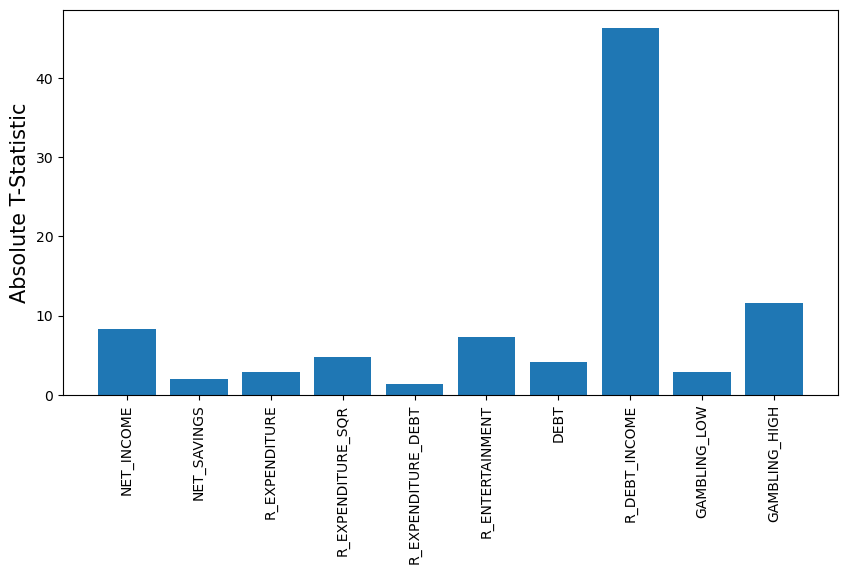

In [36]:
# Get the absolute values of t-statistics from the model_ols

t_statistic = model_ols.tvalues[1:] # excluding the constant

abs_t_statistic = abs(t_statistic)

# Create a bar plot for feature importance
plt.figure(figsize=(10, 5))
plt.bar(X.columns[1:], abs_t_statistic)  

plt.ylabel('Absolute T-Statistic',size=15)
plt.xticks(rotation=90)

What Does It Mean? 
A higher absolute t-statistic value indicates that the feature has a stronger effect on the target variable. Features with t-statistics close to zero have less impact and can often be dropped without losing predictive power.

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'NET_INCOME'),
  Text(1, 0, 'NET_SAVINGS'),
  Text(2, 0, 'R_EXPENDITURE'),
  Text(3, 0, 'R_EXPENDITURE_SQR'),
  Text(4, 0, 'R_EXPENDITURE_DEBT'),
  Text(5, 0, 'R_ENTERTAINMENT'),
  Text(6, 0, 'DEBT'),
  Text(7, 0, 'R_DEBT_INCOME'),
  Text(8, 0, 'GAMBLING_LOW'),
  Text(9, 0, 'GAMBLING_HIGH')])

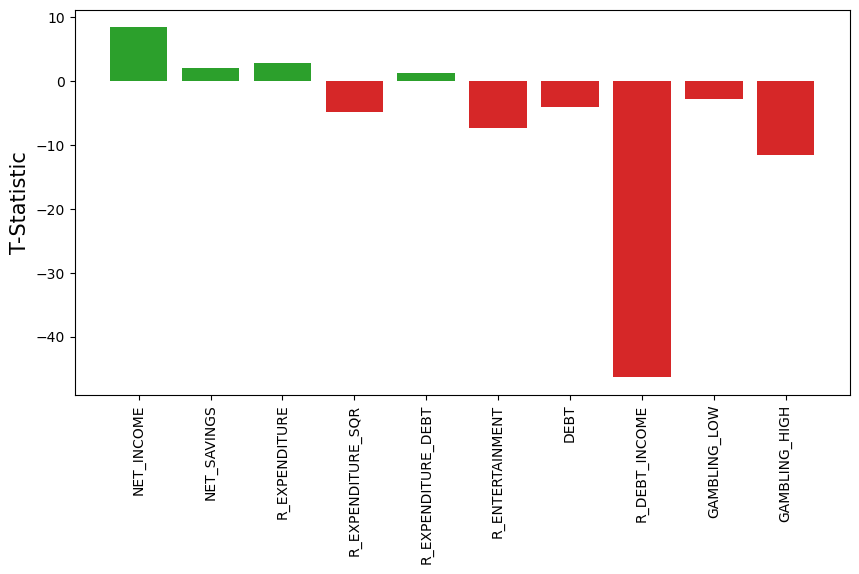

In [38]:
# Get bar colors based on the sign of the t-statistics

colors = ['tab:red' if t < 0 else 'tab:green' for t in t_statistic]

plt.figure(figsize=(10, 5))
plt.bar(X.columns[1:], t_statistic, color=colors)

plt.ylabel('T-Statistic', size=15)
plt.xticks(rotation=90)

Detailed Interpretation: Understanding the Role of the t-Statistic

The t-statistic evaluates whether a specific feature's coefficient is significantly different from zero, testing the null hypothesis that the feature has no impact on the target variable. A high absolute t-statistic (generally greater than 2) indicates that the null hypothesis can be rejected, suggesting that the feature plays a significant role in predicting the target.

Feature Importance
Features with larger absolute t-statistics are more influential in the model's predictions. For example, a t-statistic of 3.0 (approx from graph) for R_EXPENDITURE indicates it is moderately important, while a t-statistic of -48.00 (approx from graph) for R_DEBT_INCOME highlights a strong negative influence on the target variable.

Real-World Analogy
The t-statistic can be likened to a spotlight in a theater production. A brighter spotlight (higher t-statistic) makes it easier for the audience (the model) to recognize the importance of the performer (the feature) in shaping the storyline (the target variable).

Feature Significance in the Model
In this model, R_DEBT_INCOME has a large negative t-statistic, revealing a strong negative correlation with CREDIT_SCORE. This suggests that individuals with higher debt-to-income ratios are more likely to have lower credit scores. On the other hand, INCOME has a smaller t-statistic, indicating that its impact on credit scores is weaker compared to more influential variables like R_EXPENDITURE.

## [4] Weight Plot: Understanding Feature Influence

Index(['GAMBLING_HIGH', 'GAMBLING_LOW', 'R_DEBT_INCOME', 'DEBT',
       'R_ENTERTAINMENT', 'R_EXPENDITURE_DEBT', 'R_EXPENDITURE_SQR',
       'R_EXPENDITURE', 'NET_SAVINGS', 'NET_INCOME'],
      dtype='object')


Text(0.5, 0, 'Coefficient (Weight)')

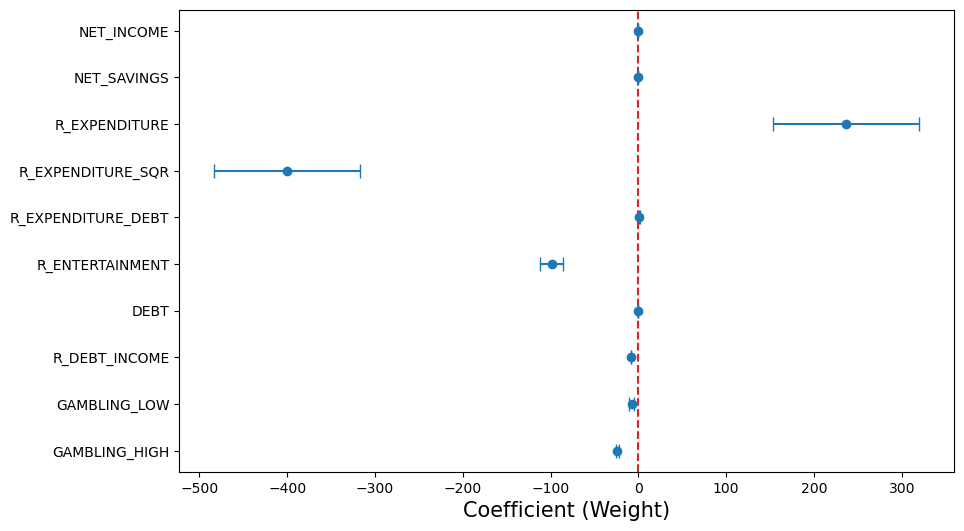

In [41]:
# Get coefficients and standard errors
coefficients = model_ols.params[1:][::-1]

se = model_ols.bse[1:][::-1]

features = X.columns[1:][::-1]
print(features)

plt.figure(figsize=(10, 6))

# Plot vertical dotted line at x=0
plt.axvline(x=0, color='tab:red', linestyle='--')

# Plot the coefficients and error bars
plt.errorbar(coefficients, 
             features, 
             xerr=se, 
             fmt='o', 
             capsize=5)

plt.xlabel('Coefficient (Weight)', size=15)

Visual Interpretation:
The Weight Plot will visually highlight the most impactful features by the length of the bars. Features with larger bars (either positive or negative) are the ones driving the model’s predictions the most.

What happensin case we scale the data, here scaling using StandardScaler.

In [44]:
scaler = StandardScaler()

# Scale the features
X_scaled = scaler.fit_transform(X.drop(columns='const'))
X_scaled = pd.DataFrame(X_scaled, columns=X.columns[1:])
X_scaled = statsmodels.add_constant(X_scaled)

# Fit a linear regression model with scaled features
model_ols_scaled = statsmodels.OLS(y, X_scaled).fit()

# Output the summary of the model
print(model_ols_scaled.summary())

                            OLS Regression Results                            
Dep. Variable:       NET_CREDIT_SCORE   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.828
Method:                 Least Squares   F-statistic:                     481.2
Date:                Tue, 28 Jan 2025   Prob (F-statistic):               0.00
Time:                        19:06:43   Log-Likelihood:                -4683.6
No. Observations:                1000   AIC:                             9389.
Df Residuals:                     989   BIC:                             9443.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                586.7120      0

Text(0.5, 0, 'Coefficient (Weight)')

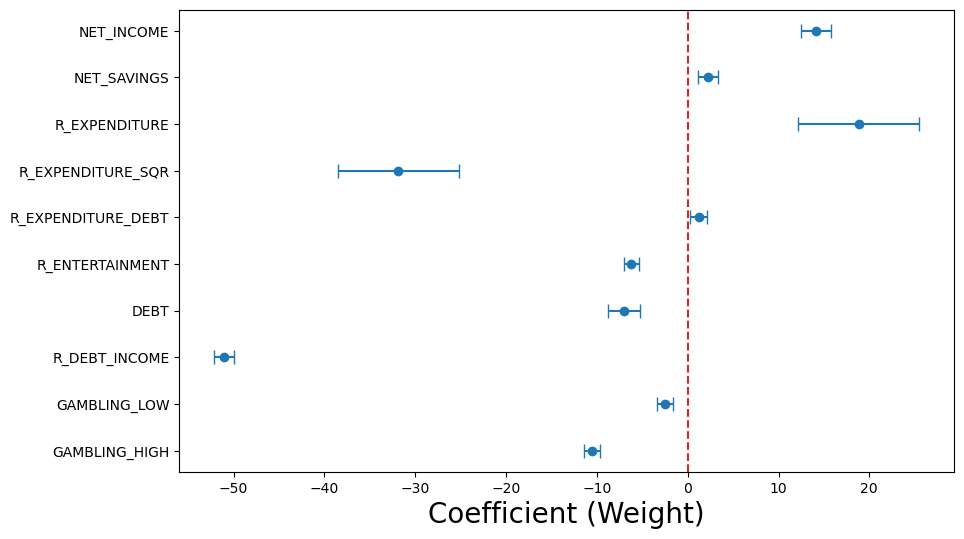

In [45]:
# Geting coefficients and standard errors

coefficients = model_ols_scaled.params[1:][::-1]

se = model_ols_scaled.bse[1:][::-1]

features = X_scaled.columns[1:][::-1]

## Creating a weight plot with scaled features
plt.figure(figsize=(10, 6))
plt.axvline(x=0, color='tab:red', linestyle='--')
plt.errorbar(coefficients, 
             features, 
             xerr=se, 
             fmt='o', 
             capsize=5)
plt.xlabel('Coefficient (Weight)', size=20)

Lets looks at R_DEBT_INCOME!

Key Takeaways:
Features such as R_EXPENDITURE and R_DEBT_INCOME, which have larger weights (both positive and negative), serve as significant drivers of credit scores. On the other hand, features with weights near zero have minimal impact and could be considered for removal or re-engineering to simplify the model.

## [5] Effect Plot: How Features Affect Predictions

An Effect Plot visualizes how a change in a feature’s value impacts the target variable, showing if the relationship is linear, monotonic, or more complex.
It plots the feature values on the x-axis and the target values on the y-axis.

Text(0.5, 0, 'Effect on Net Credit Score')

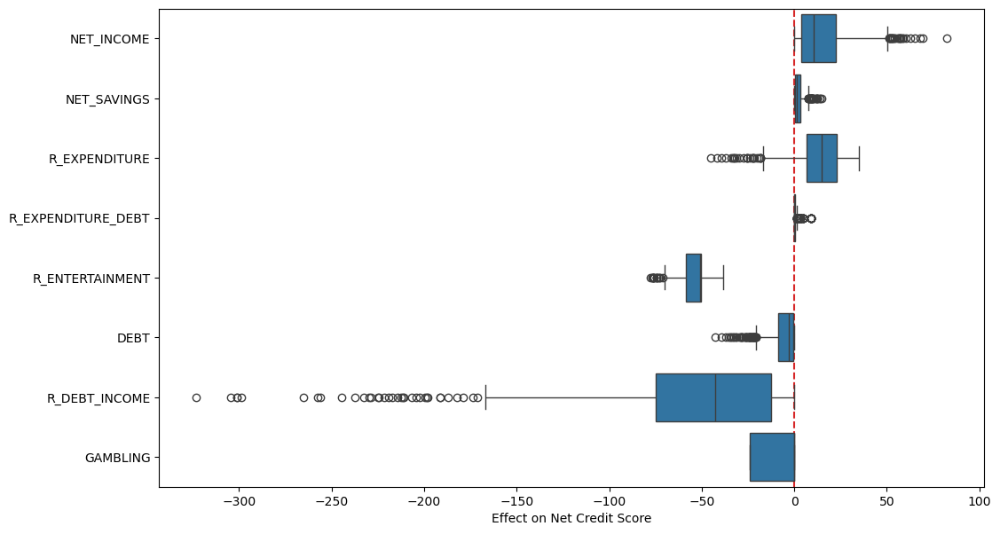

In [49]:
# Generating Effect Plot

# Calculate the feature effects 
feature_effects = X * model_ols.params

# Combine feature effects for related features
feature_effects['R_EXPENDITURE'] = feature_effects['R_EXPENDITURE'] + feature_effects['R_EXPENDITURE_SQR']
feature_effects['GAMBLING'] = feature_effects['GAMBLING_LOW']+feature_effects['GAMBLING_HIGH']
feature_effects.drop(['const','R_EXPENDITURE_SQR','GAMBLING_LOW','GAMBLING_HIGH'],axis=1,inplace=True)

# Create effect plots using boxplots
plt.figure(figsize=(12, 7))
plt.axvline(x=0, color='tab:red', linestyle='--')
sns.boxplot(data=feature_effects, orient="h", color="tab:Blue")
plt.xlabel("Effect on Net Credit Score", size=10)

## [6] Mean Effect Plot : Averaging Out Feature Contributions

This plot displays the average effect of each feature on the target variable, combining the insights from all individual predictions into a single view.
It provides a more holistic understanding of how a feature behaves on average.

Text(0.5, 0, 'Mean Effect on Credit Score')

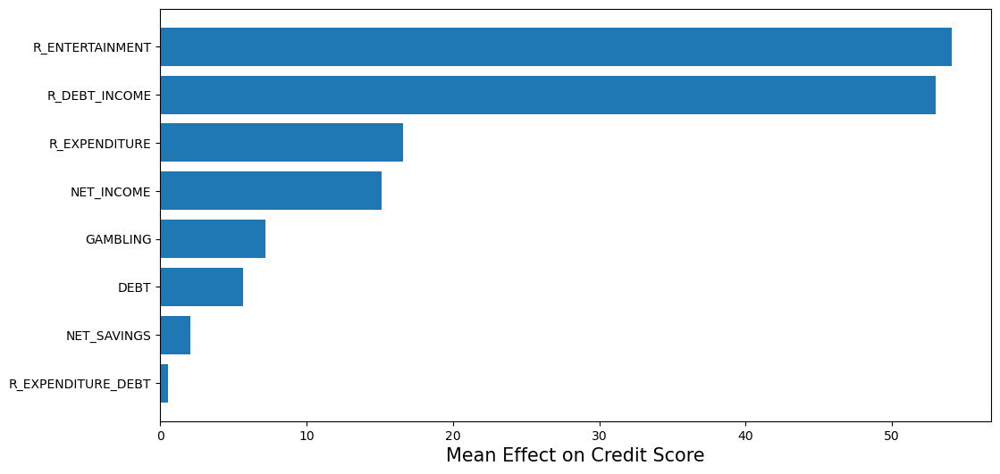

In [52]:
# Generating Mean Effect Plot

# Calculate the feature effects 
feature_effects = X * model_ols.params

# Combine feature effects for related features
feature_effects['R_EXPENDITURE'] = feature_effects['R_EXPENDITURE'] + feature_effects['R_EXPENDITURE_SQR']
feature_effects['GAMBLING'] = feature_effects['GAMBLING_LOW']+feature_effects['GAMBLING_HIGH']
feature_effects.drop(['const','R_EXPENDITURE_SQR','GAMBLING_LOW','GAMBLING_HIGH'],axis=1,inplace=True)

# The absolute average contribution of each feature is computed. This avoids positive and negative contributions canceling each other out.
feature_effects = abs(feature_effects)
mean_effects = feature_effects.mean(axis=0)

# The features are sorted in descending order of their mean effect, ensuring the most impactful features are at the top.
mean_effects.sort_values(inplace=True)

# Create a bar plot for feature importance
plt.figure(figsize=(12, 6))
plt.barh(mean_effects.index, mean_effects)
plt.xlabel('Mean Effect on Credit Score', size=15)

This plot is particularly useful for understanding the overall model behavior and making feature selection decisions.
This plot helps in understanding feature importance and can guide feature engineering or decision-making processes in credit scoring models.

Visual Interpretation:
The Mean Effect Plot provides a summary view, where each bar represents the average impact of the feature across all predictions.

Features with higher bars in the plot are more influential in determining the credit score.
For example, R_ENTERTAINMENT might reflect discretionary spending habits, which could heavily influence credit scoring models.

## [7] Effect Trend Plot : Visualizing Feature Influence Over a Range of Values

This plot illustrates how changes in a specific feature’s value influence the target variable’s prediction.

Text(0, 0.5, 'Effect on Credit Score')

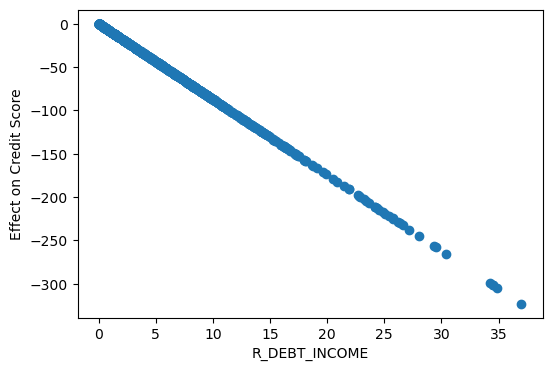

In [56]:
# Generating Effect Trend Plot

# Calculate the feature effects 
feature_effects = X * model_ols.params

# Plot effect of R_DEPT_INCOME
plt.figure(figsize=(6, 4))
plt.scatter(X['R_DEBT_INCOME'], feature_effects['R_DEBT_INCOME'])

plt.xlabel('R_DEBT_INCOME', size=10)
plt.ylabel('Effect on Credit Score', size=10)

## [8] Partial Dependence Plot (PDP): Isolating the Impact of a Single Feature

                            OLS Regression Results                            
Dep. Variable:       NET_CREDIT_SCORE   R-squared:                       0.736
Model:                            OLS   Adj. R-squared:                  0.736
Method:                 Least Squares   F-statistic:                     2782.
Date:                Tue, 28 Jan 2025   Prob (F-statistic):          7.17e-291
Time:                        19:06:46   Log-Likelihood:                -4902.2
No. Observations:                1000   AIC:                             9808.
Df Residuals:                     998   BIC:                             9818.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           643.1667      1.486    432.810

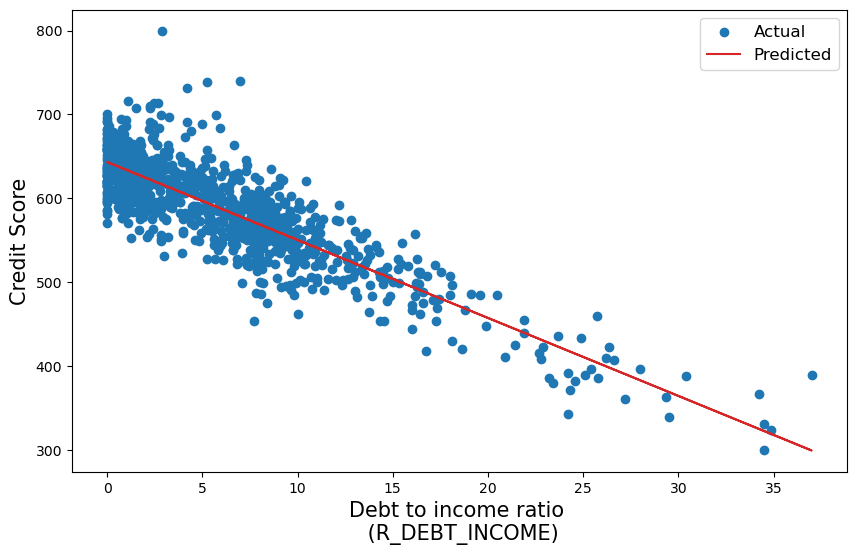

In [58]:
# Fitting a linear regression model with only debt-to-income ratio usjng OLS lib
model_ols_income = statsmodels.OLS(y, X[['const','R_DEBT_INCOME']]).fit()

print(model_ols_income.summary())


# Plot credit score vs income
plt.figure(figsize=(10, 6))
plt.scatter(X['R_DEBT_INCOME'], y,label='Actual')

# Plot the regression line
pred = model_ols_income.predict(X[['const','R_DEBT_INCOME']])
plt.plot(X['R_DEBT_INCOME'],
        pred, 
        color='tab:red',
        label='Predicted')

plt.xlabel('Debt to income ratio \n (R_DEBT_INCOME)', size=15)
plt.ylabel('Credit Score', size=15)

plt.legend(fontsize=12)

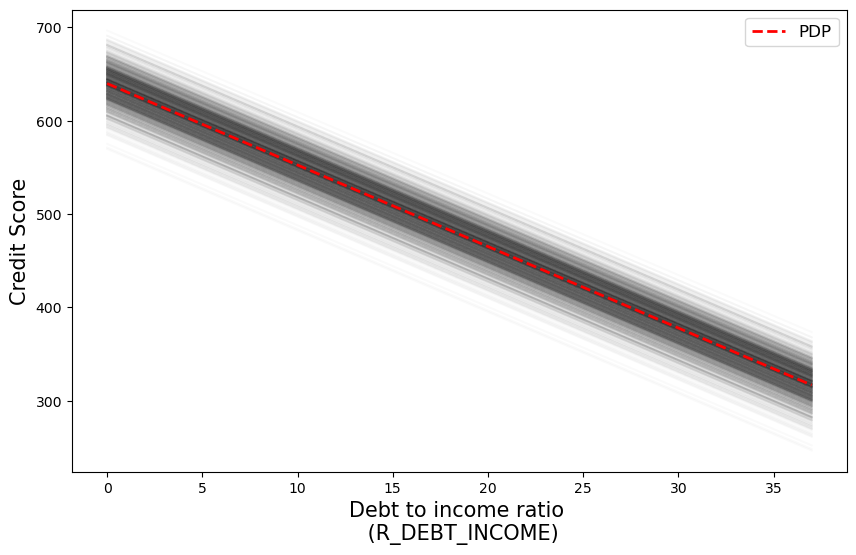

In [59]:
# Create a list of values for the features:
feature_values = np.linspace(X['R_DEBT_INCOME'].min(), X['R_DEBT_INCOME'].max(), 100)
X_pdp = X.copy()

plt.figure(figsize=(10, 6))

all_preds = []
for i,row in X_pdp.iterrows():

    preds = []
    for value in feature_values:

        # replace the value of the feature and get prediction
        row['R_DEBT_INCOME'] = value
        pred = model_ols.predict(row.values)
        preds.append(pred)

    all_preds.append(preds)

    # plot individual prediction line
    plt.plot(feature_values, preds, color='black',alpha=0.02)

# plot average prediction line
average_preds = np.mean(all_preds,axis=0)
plt.plot(feature_values, average_preds, color='r',linewidth=2,label='PDP',linestyle='--')

plt.xlabel('Debt to income ratio \n (R_DEBT_INCOME)', size=15)
plt.ylabel('Credit Score', size=15)

plt.legend(fontsize=12)

## [9] Local Interpretable Model-Agnostic Explanations (LIME): That approximates any black box machine learning model with a local, interpretable model to explain each individual prediction

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor

# Step 3: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 4: Fit a Decision Tree Regressor model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [152]:
feature_importance = model.feature_importances_
feature_importance

array([0.        , 0.04366536, 0.03792743, 0.0154849 , 0.06819249,
       0.01775099, 0.02269507, 0.01544164, 0.7579373 , 0.00174713,
       0.01915769])

In [170]:
feature_names = X.columns

importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})

importance_df = importance_df.sort_values(by = "Importance", ascending=False)
print(importance_df)

plt.barh(importance_df['Feature'], importance_df['Importance']);



               Feature  Importance
8        R_DEBT_INCOME    0.757937
4    R_EXPENDITURE_SQR    0.068192
1           NET_INCOME    0.043665
2          NET_SAVINGS    0.037927
6      R_ENTERTAINMENT    0.022695
10       GAMBLING_HIGH    0.019158
5   R_EXPENDITURE_DEBT    0.017751
3        R_EXPENDITURE    0.015485
7                 DEBT    0.015442
9         GAMBLING_LOW    0.001747
0                const    0.000000


<Axes: >

In [172]:
importance_df[['Feature','Importance']].sort_values(by='Importance',ascending=False).plot(kind='bar',stacked=True)

<Axes: >

In [166]:
# permutation importance
from sklearn.inspection import permutation_importance

result = permutation_importance(model, X_test, y_test, n_repeats = 10, random_state = 42)

sorted_index = result.importances_mean.argsort()
print(sorted_index)

plt.barh(df.columns[sorted_index], result.importances_mean[sorted_index]);

[ 7 10  0  9  6  5  2  3  1  4  8]


In [64]:
y_pred = model.predict(X_test)


from sklearn.metrics import mean_squared_error

mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 1755.87


In [65]:
!pip install lime

In [66]:
import lime
import lime.lime_tabular

# Create a LIME explainer object using the training data
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X.columns,
                                                   class_names=['NET_CREDIT_SCORE'],
                                                   mode='regression')

# Select a single instance from the test set for explanation
instance0 = X_test.iloc[0].values  # Selecting the first instance for demonstration

# Generate LIME explanation for  above selected instance
explanation = explainer.explain_instance(instance0, model.predict)

# Show the LIME explanation as a plot
explanation.show_in_notebook(show_table=True, show_all=False)

In [67]:
# [OTHER EXAMPLE] Select a single instance from the test set for explanation
instance1 = X_test.iloc[20].values  # Selecting the first instance for demonstration

# Generate LIME explanation for  above selected instance
explanation = explainer.explain_instance(instance1, model.predict)

# Show the LIME explanation as a plot
explanation.show_in_notebook(show_table=True, show_all=False)

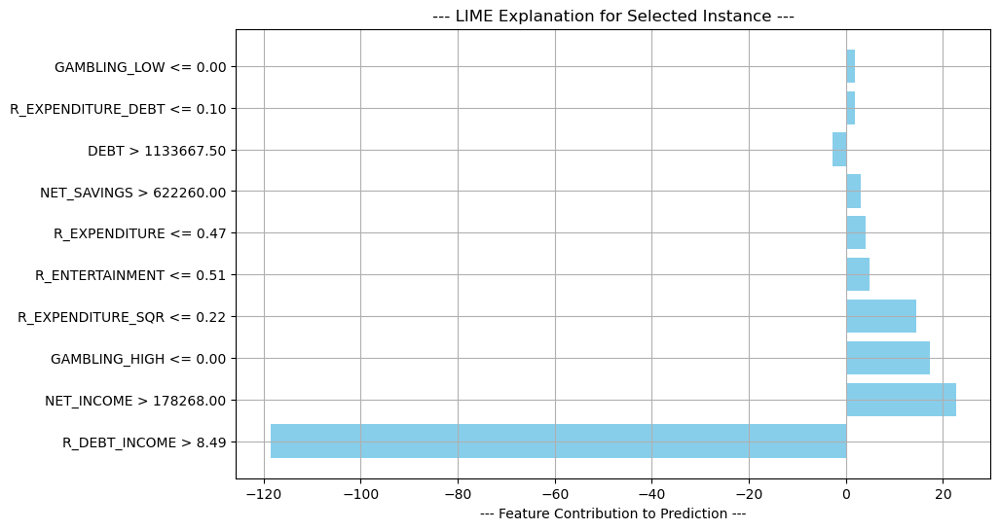

In [68]:
# Extracting feature names and their contributions from the LIME explanation

features = [f for f, _ in explanation.as_list()]
contributions = [c for _, c in explanation.as_list()]

# Create a horizontal bar plot for LIME explanations
plt.figure(figsize=(10, 6))
plt.barh(features, contributions, color='skyblue')
plt.xlabel("--- Feature Contribution to Prediction ---")
plt.title("--- LIME Explanation for Selected Instance ---")
plt.grid(True)
plt.show()

## [10] SHAP (SHapley Additive exPlanations): quantifying how much each feature contributes to a specific prediction by considering all possible feature combinations

In [70]:
import shap

# Calculate SHAP values
shap.sample(X, 5)
explainer = shap.KernelExplainer(model.predict,X[:200])
shap.sample(X, 5)
shap_values = explainer(X)
shap.plots.waterfall(shap_values[0], show=False)

# make prediction
predictions = model.predict(X)

# calculate average prediction
print(np.mean(predictions))

# SHAP bar plot
shap.plots.bar(shap_values, show=False)

Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/1000 [00:00<?, ?it/s]

585.766


<Axes: xlabel='mean(|SHAP value|)'>

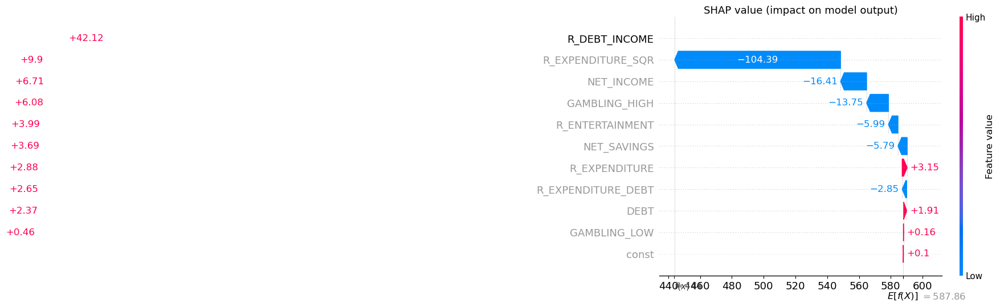

In [71]:
# Visualize the SHAP values

shap.initjs()

shap.summary_plot(shap_values, X) 

In [72]:
explainer_shap = shap.TreeExplainer(model)

shap_values = explainer_shap(X_test, check_additivity = False)
shap_values[0]  

.values =
array([ 0.        , -3.10787701,  2.78982211, -0.8453442 , -2.65310003,
        0.59515928,  5.02419005,  0.15848791, 43.34377909,  0.51476378,
        2.66386903])

.base_values =
587.5162500000001

.data =
array([1.0000000e+00, 5.8387000e+04, 8.3493400e+05, 5.5780000e-01,
       3.1114084e-01, 6.6670000e-01, 5.1500000e-01, 8.7580000e+04,
       1.5000000e+00, 0.0000000e+00, 0.0000000e+00])

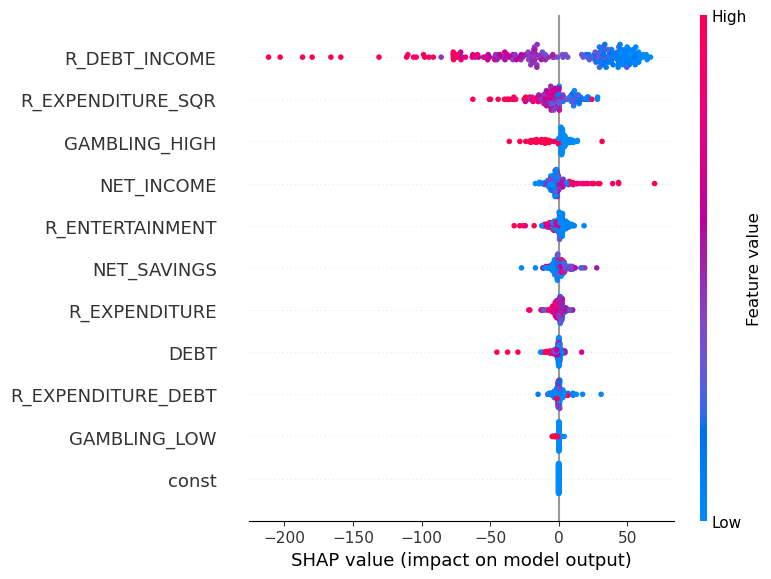

In [73]:
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

In [74]:
print(type(shap_values))

<class 'shap._explanation.Explanation'>


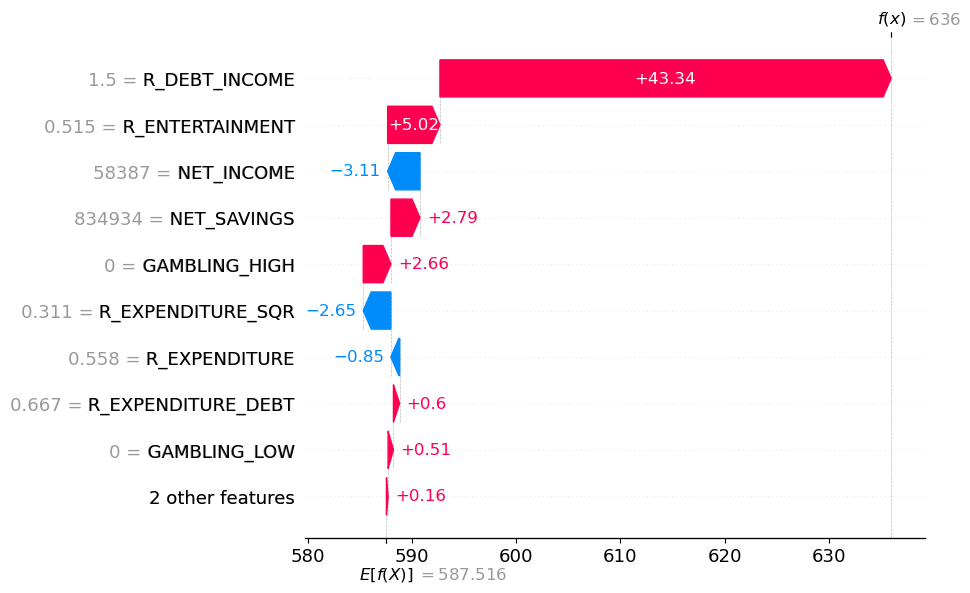

In [75]:
shap.plots.waterfall(shap_values[0]) # or any random value

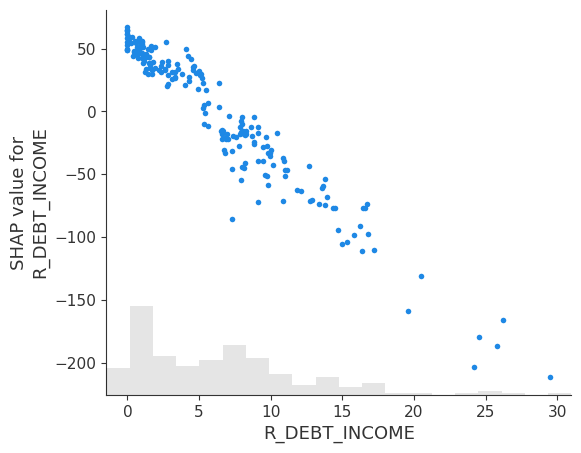

In [76]:
shap.plots.scatter(shap_values[:, "R_DEBT_INCOME"])